**Logistic Regression**

1. Downloading the dataset

In [ ]:
import opendatasets as od
od.download('https://www.kaggle.com/jsphyg/weather-dataset-rattle-package')

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib
import plotly.express as px
import matplotlib.pyplot as plt

df = pd.read_csv("./weather-dataset-rattle-package/weatherAUS.csv")
df.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,...,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,...,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,...,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [3]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

2. Exploratory Data Analysis

In [4]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (15, 8)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [5]:
#Location vs Rainy and NonRainy

px.histogram(df, x='Location', marginal='box',color='RainToday',title='Location v/s Rain Today')

In [6]:
#Tempat3pm vs RainTomorrow
px.histogram(df, x='Temp3pm',color='RainTomorrow', title='3pm Temp v/s RainTomorrow')

In [7]:
#RainToday vs RainTomorrow
fg = px.histogram(df,x='RainTomorrow',color='RainToday',title='RainToday v/s RainTomorrow')
plt.figure(figsize=(8,5))
fg.show()

<Figure size 800x500 with 0 Axes>

In [8]:
#min vs max temp
px.scatter(df.sample(2000), x='MinTemp',y='MaxTemp',title='Min v/s Max Temp',color='RainToday')

In [9]:
#temp v/s humd at 3pm
px.scatter(df.sample(2000), x='Temp3pm', y='Humidity3pm',title='Temp v/s Humidity at 3pm',color='RainTomorrow')

In [10]:
usesample = False
samplefrac = 0.1
if usesample:
    df = df.sample(frac=samplefrac).copy()

In [11]:
from sklearn.model_selection import train_test_split
df.dropna(subset=['RainTomorrow'],inplace=True)
train_val_df, test_df = train_test_split(df,test_size=0.2,random_state=42)
train_df, val_df = train_test_split(train_val_df,test_size=0.25, random_state=42)
print('Train_df: ', train_df.shape)
print('Validation_df: ', val_df.shape)
print('Test_df: ', test_df.shape)


Train_df:  (85315, 23)
Validation_df:  (28439, 23)
Test_df:  (28439, 23)


<Axes: title={'center': 'Rows per Year'}, xlabel='Date', ylabel='count'>

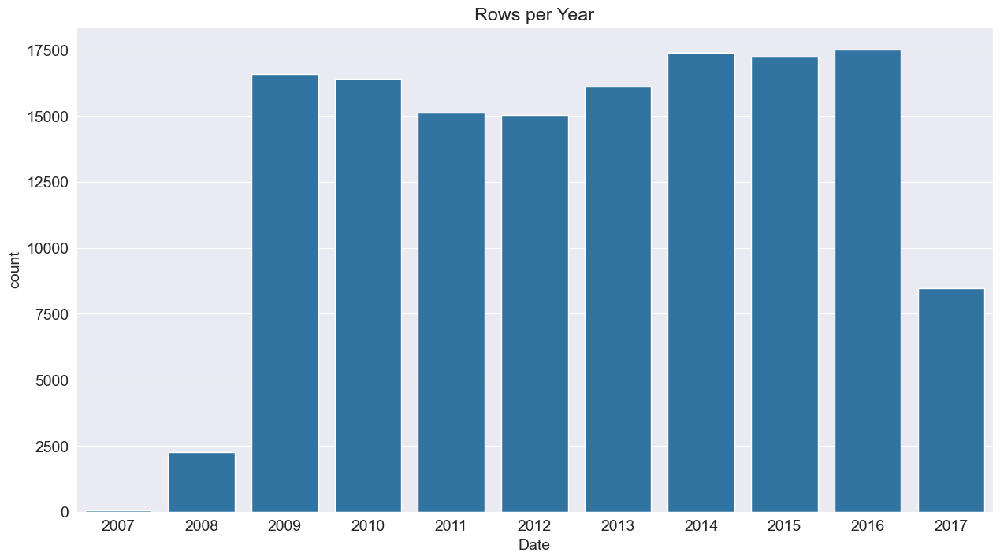

In [12]:
#years wise rows in df
plt.title('Rows per Year')
sns.countplot(x=pd.to_datetime(df.Date).dt.year)

In [13]:
year = pd.to_datetime(df.Date).dt.year
train_df = df[year < 2015]
val_df = df[year == 2015]
test_df = df[year > 2015]
print('Train_df: ', train_df.shape)
print('Validation_df: ', val_df.shape)
print('Test_df: ', test_df.shape)
df.drop(columns=['Date'],inplace=True)


Train_df:  (98988, 23)
Validation_df:  (17231, 23)
Test_df:  (25974, 23)


3. Identifying Input and Target columns

In [14]:
inps_col = list(df.columns)[-2::-1]
targ_col = 'RainTomorrow'

In [15]:
train_inps = train_df[inps_col].copy()
train_targ = train_df[targ_col].copy()
val_inps = val_df[inps_col].copy()
val_targ = val_df[targ_col].copy()
test_inps = test_df[inps_col].copy()
test_targ = test_df[targ_col].copy()

In [16]:
#identify numerical and categorical
import numpy as np
num_cols = train_inps.select_dtypes(include=np.number).columns.tolist()
cat_cols = train_inps.select_dtypes('object').columns.tolist()
num_cols, cat_cols

(['Temp3pm',
  'Temp9am',
  'Cloud3pm',
  'Cloud9am',
  'Pressure3pm',
  'Pressure9am',
  'Humidity3pm',
  'Humidity9am',
  'WindSpeed3pm',
  'WindSpeed9am',
  'WindGustSpeed',
  'Sunshine',
  'Evaporation',
  'Rainfall',
  'MaxTemp',
  'MinTemp'],
 ['RainToday', 'WindDir3pm', 'WindDir9am', 'WindGustDir', 'Location'])

In [17]:
df[num_cols].describe()

,Temp3pm,Temp9am,Cloud3pm,Cloud9am,Pressure3pm,Pressure9am,Humidity3pm,Humidity9am,WindSpeed3pm,WindSpeed9am,WindGustSpeed,Sunshine,Evaporation,Rainfall,MaxTemp,MinTemp
count,139467.000000,141289.000000,85099.000000,88536.000000,128212.000000,128179.000000,138583.000000,140419.000000,139563.000000,140845.000000,132923.000000,74377.000000,81350.000000,140787.000000,141871.000000,141556.000000
mean,21.687235,16.987509,4.503167,4.437189,1015.258204,1017.653758,51.482606,68.843810,18.637576,14.001988,39.984292,7.624853,5.469824,2.349974,23.226784,12.186400
std,6.937594,6.492838,2.720633,2.887016,7.036677,7.105476,20.797772,19.051293,8.803345,8.893337,13.588801,3.781525,4.188537,8.465173,7.117618,6.403283
min,-5.400000,-7.200000,0.000000,0.000000,977.100000,980.500000,0.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,-4.800000,-8.500000
25%,16.600000,12.300000,2.000000,1.000000,1010.400000,1012.900000,37.000000,57.000000,13.000000,7.000000,31.000000,4.900000,2.600000,0.000000,17.900000,7.600000
50%,21.100000,16.700000,5.000000,5.000000,1015.200000,1017.600000,52.000000,70.000000,19.000000,13.000000,39.000000,8.500000,4.800000,0.000000,22.600000,12.000000
75%,26.400000,21.600000,7.000000,7.000000,1020.000000,1022.400000,66.000000,83.000000,24.000000,19.000000,48.000000,10.600000,7.400000,0.800000,28.200000,16.800000
max,46.700000,40.200000,9.000000,9.000000,1039.600000,1041.000000,100.000000,100.000000,87.000000,130.000000,135.000000,14.500000,145.000000,371.000000,48.100000,33.900000


In [18]:
train_df[cat_cols].nunique()

RainToday       2
WindDir3pm     16
WindDir9am     16
WindGustDir    16
Location       49
dtype: int64

4.Removing missing values

In [19]:
#find null value counts in each columns
df[num_cols].isna().sum()

Temp3pm           2726
Temp9am            904
Cloud3pm         57094
Cloud9am         53657
Pressure3pm      13981
Pressure9am      14014
Humidity3pm       3610
Humidity9am       1774
WindSpeed3pm      2630
WindSpeed9am      1348
WindGustSpeed     9270
Sunshine         67816
Evaporation      60843
Rainfall          1406
MaxTemp            322
MinTemp            637
dtype: int64

In [20]:
#using SimpleImputer
from sklearn.impute import SimpleImputer
imp = SimpleImputer(strategy='mean')
imp.fit(df[num_cols])

,missing_values,nan
,strategy,'mean'
,fill_value,None
,copy,True
,add_indicator,False
,keep_empty_features,False


In [21]:
#obtain mean of each columns
imp.statistics_

array([  21.68723497,   16.98750858,    4.5031669 ,    4.43718939,
       1015.25820354, 1017.65375842,   51.48260609,   68.84381031,
         18.63757586,   14.001988  ,   39.98429166,    7.62485311,
          5.46982422,    2.34997407,   23.22678419,   12.18639973])

In [22]:
train_inps[num_cols] = imp.transform(train_inps[num_cols])
val_inps[num_cols] = imp.transform(val_inps[num_cols])
test_inps[num_cols] = imp.transform(test_inps[num_cols])

train_inps[num_cols].isna().sum() # replaced all missing values with res.column mean

Temp3pm          0
Temp9am          0
Cloud3pm         0
Cloud9am         0
Pressure3pm      0
Pressure9am      0
Humidity3pm      0
Humidity9am      0
WindSpeed3pm     0
WindSpeed9am     0
WindGustSpeed    0
Sunshine         0
Evaporation      0
Rainfall         0
MaxTemp          0
MinTemp          0
dtype: int64

In [23]:
#for categorial columns
imp2 = SimpleImputer(strategy='most_frequent')
imp2.fit(df[cat_cols])
train_inps[cat_cols] = imp2.transform(train_inps[cat_cols])
val_inps[cat_cols] = imp2.transform(val_inps[cat_cols])
test_inps[cat_cols] = imp2.transform(test_inps[cat_cols])

train_inps[cat_cols].isna().sum() 

RainToday      0
WindDir3pm     0
WindDir9am     0
WindGustDir    0
Location       0
dtype: int64

5. Scaling of each columns

In [37]:
from sklearn.preprocessing import MinMaxScaler
scal = MinMaxScaler()
scal.fit(df[num_cols])

,feature_range,"(0, ...)"
,copy,True
,clip,False


In [38]:
num_cols

['Temp3pm',
 'Temp9am',
 'Cloud3pm',
 'Cloud9am',
 'Pressure3pm',
 'Pressure9am',
 'Humidity3pm',
 'Humidity9am',
 'WindSpeed3pm',
 'WindSpeed9am',
 'WindGustSpeed',
 'Sunshine',
 'Evaporation',
 'Rainfall',
 'MaxTemp',
 'MinTemp']

In [25]:
#minimum values of each numeric cols
scal.data_max_

array([  46.7,   40.2,    9. ,    9. , 1039.6, 1041. ,  100. ,  100. ,
         87. ,  130. ,  135. ,   14.5,  145. ,  371. ,   48.1,   33.9])

In [26]:
#maximum values of each numeric cols
scal.data_min_

array([ -5.4,  -7.2,   0. ,   0. , 977.1, 980.5,   0. ,   0. ,   0. ,
         0. ,   6. ,   0. ,   0. ,   0. ,  -4.8,  -8.5])

In [27]:
train_inps[num_cols] = scal.transform(train_inps[num_cols])
val_inps[num_cols] = scal.transform(val_inps[num_cols])
test_inps[num_cols] = scal.transform(test_inps[num_cols])

6. Encoding categorical columns

In [28]:
from sklearn.preprocessing import OneHotEncoder
encd = OneHotEncoder(handle_unknown='ignore',sparse_output=False)
encd.fit(df[cat_cols])

,categories,'auto'
,drop,None
,sparse_output,False
,dtype,<class 'numpy.float64'>
,handle_unknown,'ignore'
,min_frequency,None
,max_categories,None
,feature_name_combiner,'concat'


In [29]:
encd.categories_

[array(['No', 'Yes', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAir

In [30]:

encd_cols = list(encd.get_feature_names_out(cat_cols))
encd_cols

['RainToday_No',
 'RainToday_Yes',
 'RainToday_nan',
 'WindDir3pm_E',
 'WindDir3pm_ENE',
 'WindDir3pm_ESE',
 'WindDir3pm_N',
 'WindDir3pm_NE',
 'WindDir3pm_NNE',
 'WindDir3pm_NNW',
 'WindDir3pm_NW',
 'WindDir3pm_S',
 'WindDir3pm_SE',
 'WindDir3pm_SSE',
 'WindDir3pm_SSW',
 'WindDir3pm_SW',
 'WindDir3pm_W',
 'WindDir3pm_WNW',
 'WindDir3pm_WSW',
 'WindDir3pm_nan',
 'WindDir9am_E',
 'WindDir9am_ENE',
 'WindDir9am_ESE',
 'WindDir9am_N',
 'WindDir9am_NE',
 'WindDir9am_NNE',
 'WindDir9am_NNW',
 'WindDir9am_NW',
 'WindDir9am_S',
 'WindDir9am_SE',
 'WindDir9am_SSE',
 'WindDir9am_SSW',
 'WindDir9am_SW',
 'WindDir9am_W',
 'WindDir9am_WNW',
 'WindDir9am_WSW',
 'WindDir9am_nan',
 'WindGustDir_E',
 'WindGustDir_ENE',
 'WindGustDir_ESE',
 'WindGustDir_N',
 'WindGustDir_NE',
 'WindGustDir_NNE',
 'WindGustDir_NNW',
 'WindGustDir_NW',
 'WindGustDir_S',
 'WindGustDir_SE',
 'WindGustDir_SSE',
 'WindGustDir_SSW',
 'WindGustDir_SW',
 'WindGustDir_W',
 'WindGustDir_WNW',
 'WindGustDir_WSW',
 'WindGustDir_nan

In [31]:
train_inps[encd_cols] = encd.transform(train_inps[cat_cols])
val_inps[encd_cols] = encd.transform(val_inps[cat_cols])
test_inps[encd_cols] = encd.transform(test_inps[cat_cols])

C:\Users\FLEMIN P DANIEL\AppData\Local\Temp\ipykernel_22520\3543867081.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\FLEMIN P DANIEL\AppData\Local\Temp\ipykernel_22520\3543867081.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\FLEMIN P DANIEL\AppData\Local\Temp\ipykernel_22520\3543867081.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

7. Save as paraquet

In [32]:
print('train_inputs:', train_inps.shape)
print('train_targets:', train_targ.shape)
print('val_inputs:', val_inps.shape)
print('val_targets:', val_targ.shape)
print('test_inputs:', test_inps.shape)
print('test_targets:', test_targ.shape)

train_inputs: (98988, 124)
train_targets: (98988,)
val_inputs: (17231, 124)
val_targets: (17231,)
test_inputs: (25974, 124)
test_targets: (25974,)


In [33]:
train_inps.to_parquet('training_set.parquet')
val_inps.to_parquet('validation_set.parquet')
test_inps.to_parquet('testing_set.parquet')

pd.DataFrame(train_targ).to_parquet('training_targets.parquet')
pd.DataFrame(val_targ).to_parquet('validation_targets.parquet')
pd.DataFrame(test_targ).to_parquet('testing_targets.parquet')

8. Logistic Regression demo

In [34]:
#Read back inputs and targets

train_inputs = pd.read_parquet('training_set.parquet')
val_inputs = pd.read_parquet('validation_set.parquet')
test_inputs = pd.read_parquet('testing_set.parquet')

train_targets = pd.read_parquet('training_targets.parquet')[targ_col]
val_targets = pd.read_parquet('validation_targets.parquet')[targ_col]
test_targets = pd.read_parquet('testing_targets.parquet')[targ_col]

In [35]:
from sklearn.linear_model import LogisticRegression
mod1 = LogisticRegression(solver='liblinear')
mod1.fit(train_inputs[num_cols+encd_cols], train_targets)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'liblinear'
,max_iter,100
,multi_class,'deprecated'


In [40]:
mod1.coef_.tolist()

[[2.2179581046305414,
  0.5559202478218532,
  1.2673380107699956,
  -0.13119368947845733,
  -9.058600282912318,
  5.365648365157428,
  5.959564262763088,
  0.3473439487881223,
  -1.4743438277887762,
  -0.6769373225256852,
  6.678008107263404,
  -1.5998826711586405,
  0.6898823493284589,
  3.476102586552739,
  -3.2046606621732643,
  0.9006110228252233,
  -1.442302371273882,
  -0.9972800728078767,
  0.0,
  -0.22525331693174494,
  -0.1497635224314032,
  -0.22591319312951708,
  0.028684083476607402,
  -0.3193098580789759,
  -0.09041107799766569,
  0.29248145448799784,
  0.2198123170081675,
  -0.24708504689790461,
  -0.15903844494616767,
  -0.34574252583467635,
  -0.3048135721626903,
  -0.3652406459528981,
  -0.19795641517926504,
  -0.05997415821278546,
  -0.29005852125476056,
  0.0,
  -0.325556685726942,
  -0.032529989158936116,
  -0.33484296791223406,
  -0.07055235780730953,
  -0.02222483443208981,
  0.13375344629393512,
  -0.07924373650951401,
  -0.060746072668875266,
  -0.41164358568090

In [41]:
mod1.intercept_

array([-2.43958244])

In [42]:
X_train = train_inputs[num_cols + encd_cols]
X_val = val_inputs[num_cols + encd_cols]
X_test = test_inputs[num_cols + encd_cols]
train_preds = mod1.predict(X_train)

In [43]:
train_preds

array(['No', 'No', 'No', ..., 'No', 'No', 'No'],
      shape=(98988,), dtype=object)

In [44]:
train_targets

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 98988, dtype: object

In [45]:
train_probs = mod1.predict_proba(X_train)
train_probs

array([[0.94080341, 0.05919659],
       [0.9430759 , 0.0569241 ],
       [0.96192327, 0.03807673],
       ...,
       [0.98738382, 0.01261618],
       [0.98336935, 0.01663065],
       [0.87019965, 0.12980035]], shape=(98988, 2))

In [46]:
mod1.classes_

array(['No', 'Yes'], dtype=object)

In [47]:
#accuracy
from sklearn.metrics import accuracy_score
accuracy_score(train_targets, train_preds)

0.8490726148624076

In [49]:
import sklearn.metrics as skm
skm.confusion_matrix(train_targets, train_preds, normalize='true')

array([[0.94494492, 0.05505508],
       [0.4809496 , 0.5190504 ]])

In [53]:
#helper function

def pre_and_out(inps, targs, name):
    preds = mod1.predict(inps)
    acc = accuracy_score(targs, preds)
    print('Accuracy: ', acc)

    cf = skm.confusion_matrix(targs, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Predict')
    plt.ylabel('Target')
    plt.title(f'{name} Confusion Matrix')
    return preds


Accuracy:  0.8490726148624076


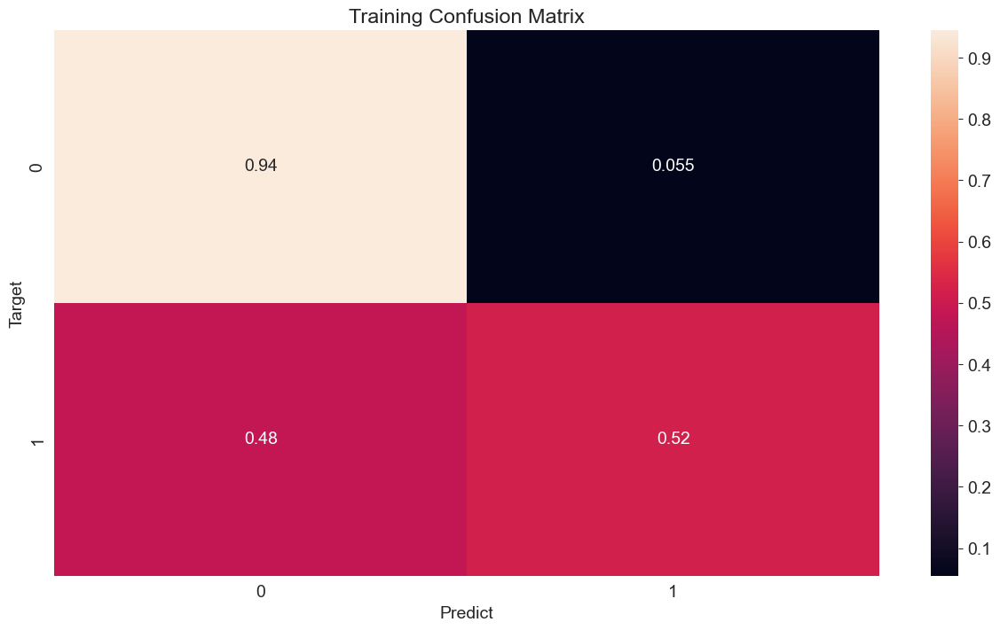

In [54]:
train_pred = pre_and_out(X_train, train_targets, 'Training')

Accuracy:  0.8528233996866114


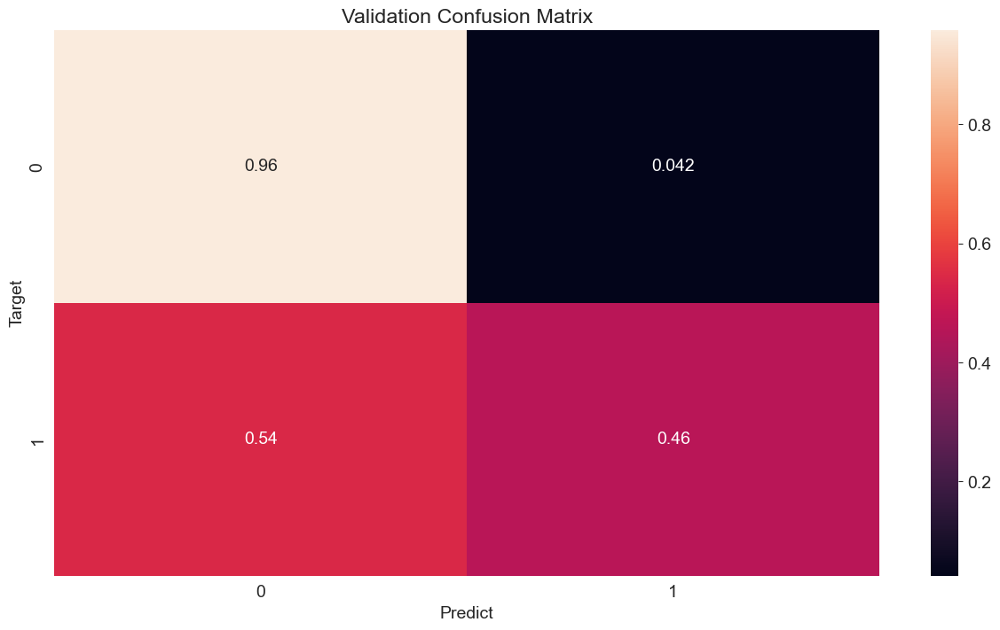

In [55]:
val_pred = pre_and_out(X_val, val_targets, 'Validation')

Accuracy:  0.8402248402248402


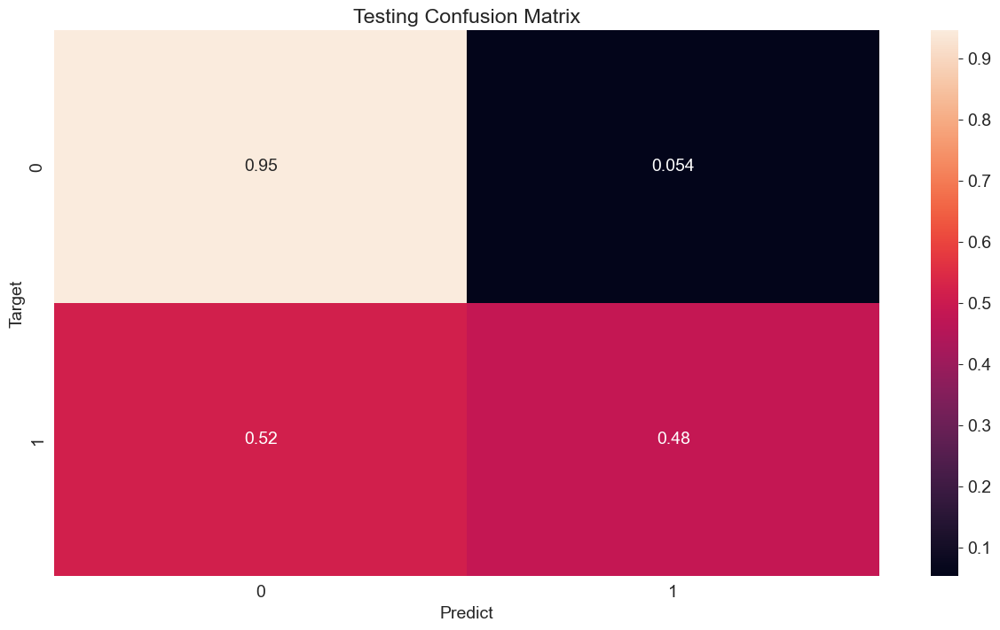

In [56]:
test_pred = pre_and_out(X_test, test_targets, 'Testing')

In [57]:
new_input = {'Date': '2021-06-19',
             'Location': 'Launceston',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

In [58]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[num_cols] = imp.transform(input_df[num_cols])
    input_df[num_cols] = scal.transform(input_df[num_cols])
    input_df[encd_cols] = encd.transform(input_df[cat_cols])
    X_input = input_df[num_cols + encd_cols]
    pred = mod1.predict(X_input)[0]
    prob = mod1.predict_proba(X_input)[0][list(mod1.classes_).index(pred)]
    return pred, prob

In [59]:
predict_input(new_input)

C:\Users\FLEMIN P DANIEL\AppData\Local\Temp\ipykernel_22520\1026210612.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\FLEMIN P DANIEL\AppData\Local\Temp\ipykernel_22520\1026210612.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\FLEMIN P DANIEL\AppData\Local\Temp\ipykernel_22520\1026210612.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

('Yes', np.float64(0.6401641074917448))

9. Saving weights and bias

In [60]:
import joblib
aussie_rain = {
    'model': mod1,
    'imputer': imp,
    'scaler': scal,
    'encoder': encd,
    'input_cols': inps_col,
    'target_col': targ_col,
    'numeric_cols': num_cols,
    'categorical_cols': cat_cols,
    'encoded_cols': encd_cols
}

In [61]:
joblib.dump(aussie_rain,'aussie_rain.joblib')

['aussie_rain.joblib']

In [62]:
aussie_rain2 = joblib.load('aussie_rain.joblib')
test_preds2 = aussie_rain2['model'].predict(X_test)
accuracy_score(test_targets, test_preds2)

0.8402248402248402